In [1]:
from aiida.orm import Dict, Str,List,Code,FolderData,RemoteData,Float,Int,ArrayData,load_code
from aiida.engine import run,submit,run_get_node,ExitCode,WorkChain,workfunction,calcfunction,ToContext
from aiida.plugins import DataFactory
import os
import pickle
import numpy as np

from cryspy.job import ctrl_job


StructureCollectionData = DataFactory("cryspy.structurecollection")
PandasFrameData = DataFactory('dataframe.frame')
RinData = DataFactory('cryspy.rin_data')
EAData = DataFactory('cryspy.ea_data')
LammpsPotentialData = DataFactory("lammps.potential")
LammpsTrajectoryData = DataFactory("lammps.trajectory")
StructureData = DataFactory('core.structure')

In [2]:
from aiida import load_profile
load_profile()

Profile<uuid='96abe6da047b431294d9057e5dbc634c' name='quicksetup'>

In [3]:

class initialize_workchain(WorkChain):

    @classmethod
    def define(cls,spec):
        super().define(spec)
        spec.input("cryspy_in_filename",valid_type=Str)
        #lock_cryspyをinputで入れる？

        spec.output("initial_structures",valid_type=StructureCollectionData)
        spec.output("opt_structures",valid_type=StructureCollectionData)
        spec.output("rslt_data",valid_type=PandasFrameData)
        spec.output("cryspy_in",valid_type=RinData)
        spec.output("id_queueing",valid_type=List)
        spec.output('detail_data', valid_type=(Dict,EAData))

        spec.outline(
            cls.call_crsypy_initialize
        )

    def call_crsypy_initialize(self):
        from cryspy.interactive import action
        init_struc_data, opt_struc_data, rin, rslt_data, id_queueing, detail_data = action.initialize()


        init_struc_node = StructureCollectionData(structures=init_struc_data)
        init_struc_node.store()
        self.out('initial_structures', init_struc_node)

        opt_struc_node = StructureCollectionData(structures=opt_struc_data)
        opt_struc_node.store()
        self.out('opt_structures', opt_struc_node)

        rslt_node = PandasFrameData(rslt_data)
        rslt_node.store()
        self.out('rslt_data', rslt_node)

        cryspy_in = RinData(rin)
        cryspy_in.store()
        self.out("cryspy_in", cryspy_in)

        id_queueing_node = List(list=id_queueing)
        id_queueing_node.store()
        self.out("id_queueing", id_queueing_node)

        algo = rin.algo
        
        if algo == "RS":
            RS_node = Dict(dict=detail_data)
            RS_node.store()
            self.out('detail_data', RS_node)

        elif algo == "EA":
            ea_node = EAData(detail_data)
            ea_node.store()
            self.out('detail_data', ea_node)

In [4]:
result,node = run.get_node(initialize_workchain, cryspy_in_filename="cryspy_in")

[2025-08-04 02:45:52,337][cryspy_init][INFO] 


Start CrySPY 1.4.0b10


[2025-08-04 02:45:52,337][cryspy_init][INFO] # ---------- Library version info
[2025-08-04 02:45:52,338][cryspy_init][INFO] pandas version: 2.2.2
[2025-08-04 02:45:52,338][cryspy_init][INFO] pymatgen version: 2024.6.10
[2025-08-04 02:45:52,339][cryspy_init][INFO] pyxtal version: 0.6.7
[2025-08-04 02:45:52,339][cryspy_init][INFO] # ---------- Read input file, cryspy.in
[2025-08-04 02:45:52,340][write_input][INFO] [basic]
[2025-08-04 02:45:52,341][write_input][INFO] algo = EA
[2025-08-04 02:45:52,341][write_input][INFO] calc_code = ASE
[2025-08-04 02:45:52,341][write_input][INFO] nstage = 1
[2025-08-04 02:45:52,341][write_input][INFO] njob = 5
[2025-08-04 02:45:52,342][write_input][INFO] jobcmd = zsh
[2025-08-04 02:45:52,342][write_input][INFO] jobfile = job_cryspy
[2025-08-04 02:45:52,342][write_input][INFO] 
[2025-08-04 02:45:52,342][write_input][INFO] [structure]
[2025-08-04 02:45:52,343][write_input][INFO] struc_

/Users/moriireo/workspace/aiida_CrySPY_nim/lib/python3.12/site-packages/aiida_dataframe/data/dataframe.py:63: FutureWarning: Starting with pandas version 3.0 all arguments of to_hdf except for the argument 'path_or_buf' will be keyword-only.
  df.to_hdf(Path(td) / self.DEFAULT_FILENAME, "w", format="table")
/Users/moriireo/workspace/aiida_CrySPY_nim/lib/python3.12/site-packages/aiida_dataframe/data/dataframe.py:68: AiidaDeprecationWarning: `PandasFrameData.set_attribute` is deprecated, use `PandasFrameData.base.attributes.set` instead. (this will be removed in v3)
  self.set_attribute("_pandas_data_hash", self._hash_dataframe(df))
/Users/moriireo/workspace/aiida_CrySPY_nim/lib/python3.12/site-packages/aiida_dataframe/data/dataframe.py:69: AiidaDeprecationWarning: `PandasFrameData.set_attribute` is deprecated, use `PandasFrameData.base.attributes.set` instead. (this will be removed in v3)
  self.set_attribute("index", list(df.index))
/Users/moriireo/workspace/aiida_CrySPY_nim/lib/python

In [5]:
result

{'initial_structures': <StructureCollectionData: uuid: 07516929-72ca-4ede-b9da-663ac97f91f4 (pk: 12771)>,
 'opt_structures': <StructureCollectionData: uuid: 9369b3b1-6b37-4d31-b225-9ee3250f7144 (pk: 12772)>,
 'rslt_data': <PandasFrameData: uuid: f5ae41fe-a15e-4fb5-aba1-dc33f48a6dcc (pk: 12773)>,
 'cryspy_in': <RinData: uuid: 5c106599-77d0-4e91-afeb-e6c3389ad3d4 (pk: 12774)>,
 'id_queueing': <List: uuid: 30189a71-7501-44e7-873d-fa871ed16072 (pk: 12775) value: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]>,
 'detail_data': <EAData: uuid: 9efa6958-f065-4bb3-88f9-20cde2bc3cf7 (pk: 12776)>}

In [6]:
from IPython.display import display

# タプルの各要素を分かりやすい変数に展開
gen, elite_struc, elite_fitness, ea_info, ea_origin = result["detail_data"].ea_data

# 1. 世代（gen）を表示
print(f"Generation: {gen}\n")

# 2. elite_struc を表示
print("--- Elite Structures ---")
print(elite_struc)
print("\n")

# 3. elite_fitness を表示
print("--- Elite Fitness ---")
print(elite_fitness)
print("\n")

# 4. ea_info (DataFrame) を綺麗に表示
print("--- EA Info (DataFrame) ---")
display(ea_info)

# 5. ea_origin (DataFrame) を綺麗に表示
print("--- EA Origin (DataFrame) ---")
display(ea_origin)

Generation: 1

--- Elite Structures ---
None


--- Elite Fitness ---
None


--- EA Info (DataFrame) ---


,Gen,Population,Crossover,Permutation,Strain,Random,Elite,crs_lat,slct_func
0,1,10,0,0,0,10,0,random,TNM


--- EA Origin (DataFrame) ---


,Gen,Struc_ID,Operation,Parent
0,1,0,random,None
1,1,1,random,None
2,1,2,random,None
3,1,3,random,None
4,1,4,random,None
5,1,5,random,None
6,1,6,random,None
7,1,7,random,None
8,1,8,random,None
9,1,9,random,None


In [7]:
initial_structures_node_1 = result['initial_structures']
tmp_opt_structures_node = result['opt_structures']
tmp_rslt_data_node = result['rslt_data']
cryspy_in_node = result['cryspy_in']
id_queueing_node_1 = result['id_queueing']
detail_data_node_1 = result['detail_data']

In [8]:
from aiida_mlip.data.model import ModelData
uri = "https://github.com/stfc/janus-core/raw/main/tests/models/chgnet_0.3.0_e29f68s314m37.pth.tar"
model = ModelData.from_uri(uri, architecture="chgnet", cache_dir="chgnet_models")

In [9]:
@calcfunction
def pack_results(**kwargs):
    """
    複数の計算結果ノードを受け取り、エネルギーと構造の辞書（pymatgen.as_dict()）
    をまとめた一つのDictノードを返す。
    """
    final_results = {}

    # 'id_0'のようなキーでデータをグループ化するための辞書
    grouped_data = {}
    for key, node in kwargs.items():
        # キーの名前からID部分 ("id_0"など) を取り出す
        id_ = '_'.join(key.split('_')[1:])

        # 辞書がなければ作成
        if id_ not in grouped_data:
            grouped_data[id_] = {}

        # キーのプレフィックスでresultかstructureかを判断
        if key.startswith('result_'):
            grouped_data[id_]['result'] = node
        elif key.startswith('structure_'):
            grouped_data[id_]['structure'] = node

    # グループ化されたデータを処理
    for id_, data in grouped_data.items():
        # resultノードからエネルギーを取得
        energy = data['result'].get_dict()['info']['chgnet_energy']

        # structureノードからpymatgenオブジェクトを取得し、JSON互換の辞書に変換
        struc_dict = data['structure'].get_pymatgen().as_dict()

        final_results[id_] = {'energy': energy, 'structure': struc_dict}

    # Python辞書をAiiDAのDictノードとして返す
    return Dict(dict=final_results)

# @calcfunction
# def pack_energy(**results):
#     """
#     複数の計算結果（Dictノード）を受け取り、
#     IDをキー、エネルギーを値とする一つの辞書を作成して返す。
#     """
#     energy_dict = {}

#     # results.items() をループ処理する（idは "id_0" のような文字列, val は AiiDAのDictノード）
#     for id, val in results.items():
#         # val（AiiDAのDictノード）からPython辞書を取得
#         result_dict = val.get_dict()

#         # 'info'辞書の中から'chgnet_energy'を取得
#         energy = result_dict.get('info', {}).get('chgnet_energy')

#         if energy is not None:
#             # 新しい辞書にIDとエネルギーを格納
#             energy_dict[id] = energy

#     # 最終的なPython辞書をAiiDAのDictノードに変換して返す
#     return Dict(dict=energy_dict)


class multi_structure_optimize_WorkChain(WorkChain):
    @classmethod
    def define(cls, spec):
        super().define(spec)
        spec.input("initial_structures", valid_type=StructureCollectionData, help='initial structure data for optimization')
        spec.input("opt_structures", valid_type=StructureCollectionData, help='optimized structure data')
        spec.input("rslt_data", valid_type=PandasFrameData, help='result data in Pandas DataFrame format')
        spec.input("id_queueing", valid_type=List, help='list of IDs for queuing structures for optimization')
        spec.input("cryspy_in", valid_type=RinData, help='RinData for cryspy input')
        spec.input("detail_data",valid_type=(Dict,EAData), help='EA data for optimization')
        spec.input("code", valid_type=Code, help='label of your code')
        spec.input("model", valid_type=ModelData, help='MLIP model data')
        spec.input("arch", valid_type=Str, help='architecture of the model')
        spec.input("precision", valid_type=Str, default=Str("float64"), help='precision for the calculation')
        spec.input("device", valid_type=Str, default=Str("cpu"), help='device for the calculation')
        spec.input("fmax", valid_type=Float,help='convergence criteria for geometry optimization')
        spec.input("vectors_only", valid_type=Bool,help='use vectorized calculation')
        spec.input("fully_opt", valid_type=Bool,help='full optimization flag')
        # spec.input('metadata', valid_type=Dict, default=Dict, help='metadata.options')

        # spec.output("energy_results", valid_type=Dict)
        # spec.output("all_results", valid_type=Dict, help='results of all workchains')
        # spec.output("retrieved", valid_type=FolderData)
        # spec.output("opt_structure", valid_type=StructureData)

        # spec.output_namespace("structure", valid_type=StructureData, dynamic=True)
        # spec.output_namespace("results", valid_type=Dict, dynamic=True)
        spec.output("structure_energy_data", valid_type=Dict, help='sorted energy results with structure data')
        # spec.output("results_energy", valid_type=Dict, help='sorted energy results')
        # spec.output("opt_structure", valid_type=StructureCollectionData)
        spec.output("opt_struc_data", valid_type=StructureCollectionData, help='optimized structure data')
        spec.output("rslt_data", valid_type=PandasFrameData, help='result data in Pandas DataFrame format')
        # spec.output("retrieved", valid_type=FolderData, help='retrieved data from the workchain')

        # spec.output_namespace("results", valid_type=Dict, dynamic=True)
        spec.output_namespace("structure", valid_type=StructureData, dynamic=True)
        # spec.output_namespace("retrieved", valid_type=FolderData, dynamic=True)
        # spec.output_namespace("remote_folder", valid_type=RemoteData, dynamic=True)
        # spec.output_namespace("time_dependent_computes", valid_type=ArrayData, dynamic=True)

        spec.exit_code(300, 'ERROR_SUB_PROCESS_FAILED', message='One or more subprocesses failed.')

        spec.outline(
            cls.optimize,
            cls.collect_results
        )


    def optimize(self):
        initial_structures_dict = self.inputs.initial_structures.structurecollection
        calculations = {}

        metadata = {
            'label': 'geometry_optimization',  # 計算にラベルを付ける（推奨）
            'description': 'Sub-process for geometry optimization',
            'options': {
                "resources": {"num_machines": 1, "num_mpiprocs_per_machine": 2}
            }
        }

        from aiida.plugins import CalculationFactory
        geomoptCalc = CalculationFactory("mlip.opt")

        for id in self.inputs.id_queueing:
            structure_ = initial_structures_dict[id]
            structure = StructureData(pymatgen=structure_)
            structure.store()
            self.out(f"structure.{id}", structure)

            calcjob_inputs = {
                'code': self.inputs.code,
                'model': self.inputs.model,
                'struct': structure,
                'arch': self.inputs.arch,
                'precision': self.inputs.precision,
                'device': self.inputs.device,
                'fmax': self.inputs.fmax,
                'vectors_only': self.inputs.vectors_only,
                'fully_opt': self.inputs.fully_opt,
            }

            future = self.submit(geomoptCalc,metadata=metadata,**calcjob_inputs)

            label = f"id_{id}"  # IDを文字列としてラベル付け
            calculations[label] = future

        return ToContext(**calculations)

            # self.ctx.node[id] = results_.get_node()

            # for key, node in self.ctx.results[id].items():
            #     self.out(f"{key}.{id}", node)
        # self.out("results", self.ctx.result)

    def collect_results(self):
        init_struc_data = self.inputs.initial_structures.structurecollection
        opt_struc_data = self.inputs.opt_structures.structurecollection
        structure_dict = {}
        results_dict = {}
        calcfunc_inputs = {}
        # opt_struc_data = {}


        # ---------- mkdir work/fin
        os.makedirs('work/fin', exist_ok=True)


        rslt_data_node = self.inputs.rslt_data
        # pandas.DataFrame として取り出す
        rslt_data = rslt_data_node.df


            # 成功判定のチェック
        for id, calculation in self.ctx.items():
            if not calculation.is_finished_ok:
                self.report(f'Sub-process for ID {id} failed with exit status {calculation.exit_status}')
                return self.exit_codes.ERROR_SUB_PROCESS_FAILED


        for cid, results_node in self.ctx.items():
            # cid = int(cid.split('_')[-1])  # IDを整数に変換
            # results_output = result_node.outputs
            # key = f"id_{cid}"  # ← 文字列のキーを作成
            # results_dict[cid] = results_node.outputs.results_dict
            # structure_dict[cid] = results_node.outputs.final_structure

            calcfunc_inputs[f"result_{cid}"] = results_node.outputs.results_dict
            calcfunc_inputs[f"structure_{cid}"] = results_node.outputs.final_structure

            rin_data = self.inputs.cryspy_in
            # rin オブジェクトを取り出す
            rin = rin_data.rin  # ← Python オブジェクトとして使用可能

            energy = results_node.outputs.results_dict['info']['chgnet_energy']  # 'chgnet_energy' キーからエネルギーを取得
            opt_struc = results_node.outputs.final_structure.get_pymatgen()

            print("energy:", energy)

            cid = int(cid.split('_')[-1])  # IDを整数に変換
            os.makedirs(f'work/{cid}',exist_ok=True)
            work_path = f'work/{cid}/'

            if rin.algo == "RS":
                gen_ = None

            elif rin.algo == "EA":
                gen_ = self.inputs.detail_data.ea_data[0]  # EADataから世代情報を取得

            #cryspyによる結果の保存
            opt_struc_data, rslt_data = ctrl_job.regist_opt(
                rin,
                cid,
                work_path,#どこでもいい
                init_struc_data,
                opt_struc_data,
                rslt_data,
                opt_struc,
                energy,
                magmom=np.nan,
                check_opt=None,
                ef=None,
                nat=None,
                n_selection=None,
                gen=gen_
            )

            # retrieved = results_output.retrieved
            # self.out("retrieved", retrieved)

        # results_dict_node = Dict(dict=results_dict)
        # structure_dict_node = Dict(dict=structure_dict)

        structure_energy_data_results = pack_results(**calcfunc_inputs)
        self.out("structure_energy_data", structure_energy_data_results)

        # sorted_energy = pack_energy(**results_dict)
        # self.out("results_energy", sorted_energy)

        # opt_structure = pack_structure(**structure_dict)
        # self.out("opt_structure", opt_structure)

        opt_struc_node = StructureCollectionData(structures=opt_struc_data)
        opt_struc_node.store()
        self.out('opt_struc_data', opt_struc_node)

        rslt_node = PandasFrameData(rslt_data)
        rslt_node.store()
        self.out('rslt_data', rslt_node)

In [ ]:
# #ssh用
# code = load_code('lammps@script_ssh2')


# input = {
#     'initial_structures': initial_structures_node,
#     'id_queueing': id_queueing_node,
#     'rslt_data': rslt_data_node,
#     'cryspy_in': cryspy_in_node,
#     'code': code,
#     "potential": potential,
#     "parameters": parameters,
#     "options": Dict(dict={'resources': {'tot_num_mpiprocs': 40,
#                                         'parallel_env': 'smp'},
#                                         'max_wallclock_seconds': 600})
# }

In [10]:
from aiida.orm import Str, Float, Bool
from aiida.orm import load_code
code = load_code("janus@localhost")

inputs = {
        'initial_structures':initial_structures_node_1,
        'opt_structures':tmp_opt_structures_node,
        'id_queueing':id_queueing_node_1,
        'rslt_data':tmp_rslt_data_node,
        'cryspy_in':cryspy_in_node,
        'detail_data':detail_data_node_1,
        "code": code,
        "model": model,
        "arch": Str(model.architecture),
        "precision": Str("float64"),
        "device": Str("mps"),
        "fmax": Float(0.1), 
        "vectors_only": Bool(False), 
        "fully_opt": Bool(True), 
        # "metadata": {"options": {"resources": {"num_machines": 1,'num_mpiprocs_per_machine': 1}}},
    }

In [11]:
result,node = run.get_node(multi_structure_optimize_WorkChain, **inputs)

/Users/moriireo/workspace/aiida_CrySPY_nim/lib/python3.12/site-packages/aiida/engine/processes/ports.py:156: UserWarning: default of input port `precision` is a `Node` instance, which can lead to unexpected side effects. It is advised to use a lambda instead, e.g.: `default=lambda: orm.Int(5)`.
  warnings.warn(UserWarning(message))
/Users/moriireo/workspace/aiida_CrySPY_nim/lib/python3.12/site-packages/aiida/engine/processes/ports.py:156: UserWarning: default of input port `device` is a `Node` instance, which can lead to unexpected side effects. It is advised to use a lambda instead, e.g.: `default=lambda: orm.Int(5)`.
  warnings.warn(UserWarning(message))


defining outputnode
energy: -48.203266143799
energy: -47.682922363281
energy: -35.892864227295
energy: -39.531425476074
energy: -46.818214416504
energy: -44.098915100098
energy: -50.261566162109
energy: -45.64102935791
energy: -44.358489990234
energy: -45.601810455322


/Users/moriireo/workspace/aiida_CrySPY_nim/lib/python3.12/site-packages/aiida_dataframe/data/dataframe.py:63: FutureWarning: Starting with pandas version 3.0 all arguments of to_hdf except for the argument 'path_or_buf' will be keyword-only.
  df.to_hdf(Path(td) / self.DEFAULT_FILENAME, "w", format="table")
/Users/moriireo/workspace/aiida_CrySPY_nim/lib/python3.12/site-packages/aiida_dataframe/data/dataframe.py:68: AiidaDeprecationWarning: `PandasFrameData.set_attribute` is deprecated, use `PandasFrameData.base.attributes.set` instead. (this will be removed in v3)
  self.set_attribute("_pandas_data_hash", self._hash_dataframe(df))
/Users/moriireo/workspace/aiida_CrySPY_nim/lib/python3.12/site-packages/aiida_dataframe/data/dataframe.py:69: AiidaDeprecationWarning: `PandasFrameData.set_attribute` is deprecated, use `PandasFrameData.base.attributes.set` instead. (this will be removed in v3)
  self.set_attribute("index", list(df.index))
/Users/moriireo/workspace/aiida_CrySPY_nim/lib/python

In [ ]:
import subprocess
import fitz  # PyMuPDF
from PIL import Image
import io
from IPython.display import display

pk = node.pk

# Step 1: verdi コマンドで .dot.pdf を生成
subprocess.call(f"verdi node graph generate {pk}", shell=True)

# Step 2: PyMuPDF で PDF を開いて画像化
pdf_path = f"{pk}.dot.pdf"
doc = fitz.open(pdf_path)
page = doc[0]
pix = page.get_pixmap(dpi=150)

# Step 3: PIL で画像として表示
image = Image.open(io.BytesIO(pix.tobytes()))
display(image)

In [12]:
result

{'structure': {'0': <StructureData: uuid: 0663e32c-8cc5-457e-98c0-31aaf1479eb9 (pk: 12784)>,
  '1': <StructureData: uuid: f78699c2-5e70-42fb-bbde-5cdcbefac6c9 (pk: 12789)>,
  '2': <StructureData: uuid: 1031529a-0b4e-468f-b1f4-99e54828c434 (pk: 12794)>,
  '3': <StructureData: uuid: 963436e7-ad5b-4349-b12f-fae87a8a34dd (pk: 12799)>,
  '4': <StructureData: uuid: adadd86b-38f2-4834-83b1-9875ba53b7a4 (pk: 12804)>,
  '5': <StructureData: uuid: fb96d432-49e0-4552-8573-4eca977cdb36 (pk: 12809)>,
  '6': <StructureData: uuid: b8265596-78f9-4daa-9449-a6b580981d0b (pk: 12814)>,
  '7': <StructureData: uuid: 53744861-1e06-4eee-bd91-e5cbfa5bf92f (pk: 12819)>,
  '8': <StructureData: uuid: 5cad15e5-83e9-45a6-b3e9-2a210c051da8 (pk: 12824)>,
  '9': <StructureData: uuid: 725d940b-9271-49ae-a799-5b692fe52fa1 (pk: 12829)>},
 'structure_energy_data': <Dict: uuid: 13dda694-ccc1-4f04-8864-db86a5c92bb7 (pk: 12925)>,
 'opt_struc_data': <StructureCollectionData: uuid: d32744db-2a09-40ea-b6ea-8e3d4387bce9 (pk: 129

第二世代の計算↓

In [13]:

class next_sg_WorkChain(WorkChain):
    @classmethod
    def define(cls, spec):
        super().define(spec)
        spec.input("initial_structures", valid_type=StructureCollectionData)
        spec.input("opt_structures", valid_type=StructureCollectionData)
        spec.input("rslt_data", valid_type=PandasFrameData)
        spec.input("detail_data", valid_type=EAData)
        spec.input("cryspy_in", valid_type=RinData, help='cryspy input data')

        spec.output("next_structures", valid_type=StructureCollectionData, help='next generation structures')
        spec.output("id_queueing", valid_type=List, help='queueing ids for next generation')
        spec.output("rslt_data",valid_type=PandasFrameData, help='result data in Pandas DataFrame format')
        spec.output("detail_data", valid_type=EAData, help='evolutionary algorithm data for next generation')

        # spec.output("next_sg", valid_type=Dict)

        spec.outline(
            cls.call_next_sg
        )

    def call_next_sg(self):

        rin_data = self.inputs.cryspy_in
        # rin オブジェクトを取り出す
        rin = rin_data.rin  # ← Python オブジェクトとして使用可能

        # with open('./data/pkl_data/gen.pkl', 'rb') as f:
        #     gen = pickle.load(f)

        gen = self.inputs.detail_data.ea_data[0]  # gen（世代）を取得

        go_next_sg = True

        init_struc_data = self.inputs.initial_structures.structurecollection
        opt_struc_data = self.inputs.opt_structures.structurecollection

        rslt_data = self.inputs.rslt_data.df

        nat_data = None
        structure_mol_id = None

        init_struc, id_queueing, ea_data_node, rslt_data = ctrl_job.next_gen_EA(
            rin,
            gen,
            go_next_sg,
            init_struc_data,
            opt_struc_data,
            rslt_data,
            nat_data,
            structure_mol_id
        )

        init_struc_node = StructureCollectionData(structures=init_struc)
        init_struc_node.store()
        self.out('next_structures', init_struc_node)

        id_queueing_node = List(list=id_queueing)
        id_queueing_node.store()
        self.out("id_queueing", id_queueing_node)

        detail_data_node = EAData(ea_data=ea_data_node)
        detail_data_node.store()
        self.out("detail_data", detail_data_node)

        rslt_node = PandasFrameData(rslt_data)
        rslt_node.store()
        self.out('rslt_data', rslt_node)

In [14]:
initial_structures_node_1
opt_structure_node_1 = result['opt_struc_data']
rslt_data_node_1 = result['rslt_data']
detail_data_node_1

<EAData: uuid: 9efa6958-f065-4bb3-88f9-20cde2bc3cf7 (pk: 12776)>

In [15]:
input = {
    'initial_structures': initial_structures_node_1,
    'opt_structures': result['opt_struc_data'],
    'rslt_data': result['rslt_data'],
    'detail_data': detail_data_node_1,
    'cryspy_in': cryspy_in_node,
}

In [ ]:
# input = {
#     'initial_structures': initial_structures_node_1,
#     'opt_structures': opt_structure_node_1,
#     'rslt_data': rslt_data_node_1,
#     'detail_data': detail_data_node_1,
#     'cryspy_in': cryspy_in_node,
# }

In [16]:
result, node = run.get_node(next_sg_WorkChain, **input)

[2025-08-04 03:11:47,831][ctrl_job][INFO] Done generation 1
[2025-08-04 03:11:47,831][utility][INFO] Backup data
[2025-08-04 03:11:47,882][ea_next_gen][INFO] # ---------- Evolutionary algorithm
[2025-08-04 03:11:47,882][ea_next_gen][INFO] Generation 2
[2025-08-04 03:11:47,883][ea_next_gen][INFO] # ------ survival of the fittest
[2025-08-04 03:11:47,914][ea_next_gen][INFO] ranking without duplication (including elite):
[2025-08-04 03:11:47,917][ea_next_gen][INFO] Structure ID      6, fitness:  -50.26157
[2025-08-04 03:11:47,920][ea_next_gen][INFO] Structure ID      0, fitness:  -48.20327
[2025-08-04 03:11:47,920][ea_next_gen][INFO] Structure ID      1, fitness:  -47.68292
[2025-08-04 03:11:47,920][ea_next_gen][INFO] Structure ID      4, fitness:  -46.81821
[2025-08-04 03:11:47,920][ea_next_gen][INFO] Structure ID      7, fitness:  -45.64103
[2025-08-04 03:11:47,922][ea_next_gen][INFO] # ------ Generate children
[2025-08-04 03:11:47,922][ea_child][INFO] # -- mindist
[2025-08-04 03:11:47,

/Users/moriireo/workspace/aiida_CrySPY_nim/lib/python3.12/site-packages/aiida_dataframe/data/dataframe.py:63: FutureWarning: Starting with pandas version 3.0 all arguments of to_hdf except for the argument 'path_or_buf' will be keyword-only.
  df.to_hdf(Path(td) / self.DEFAULT_FILENAME, "w", format="table")
/Users/moriireo/workspace/aiida_CrySPY_nim/lib/python3.12/site-packages/aiida_dataframe/data/dataframe.py:68: AiidaDeprecationWarning: `PandasFrameData.set_attribute` is deprecated, use `PandasFrameData.base.attributes.set` instead. (this will be removed in v3)
  self.set_attribute("_pandas_data_hash", self._hash_dataframe(df))
/Users/moriireo/workspace/aiida_CrySPY_nim/lib/python3.12/site-packages/aiida_dataframe/data/dataframe.py:69: AiidaDeprecationWarning: `PandasFrameData.set_attribute` is deprecated, use `PandasFrameData.base.attributes.set` instead. (this will be removed in v3)
  self.set_attribute("index", list(df.index))
/Users/moriireo/workspace/aiida_CrySPY_nim/lib/python

In [17]:
result

{'next_structures': <StructureCollectionData: uuid: 7b8d5fcb-f919-4f03-a7dd-2dfb4844000c (pk: 12929)>,
 'id_queueing': <List: uuid: d4d682a5-2054-4186-af75-2316610e2877 (pk: 12930) value: [10, 11, 12, 13, 14, 15, 16, 17, 18, 19]>,
 'detail_data': <EAData: uuid: ba6cb477-cb89-4925-bc19-8a3d395a7882 (pk: 12931)>,
 'rslt_data': <PandasFrameData: uuid: 797c94e7-3444-42e5-b68f-88bb43b47ec1 (pk: 12932)>}

In [18]:
result['next_structures'].structurecollection

{0: Structure Summary
 Lattice
     abc : 2.8100186400248206 2.8100186400249 7.3046181065299
  angles : 90.0 90.0 119.99999999999976
  volume : 49.95127162918443
       A : 2.4335475273693 -1.4050093200124 1.7206401665254e-16
       B : 0.0 2.8100186400249 1.7206401665254e-16
       C : 0.0 0.0 7.3046181065299
     pbc : True True True
 PeriodicSite: Ga (0.0, 0.0, 7.123) [0.0, 0.0, 0.9752]
 PeriodicSite: Ga (0.0, 0.0, 10.78) [0.0, 0.0, 1.475]
 PeriodicSite: Ga (0.8112, 1.405, 5.546) [0.3333, 0.6667, 0.7593]
 PeriodicSite: Ga (1.622, 1.931e-14, 1.894) [0.6667, 0.3333, 0.2593]
 PeriodicSite: N (0.8112, 1.405, 4.057) [0.3333, 0.6667, 0.5555]
 PeriodicSite: N (1.622, 1.931e-14, 0.4051) [0.6667, 0.3333, 0.05546]
 PeriodicSite: N (0.8112, 1.405, 7.003) [0.3333, 0.6667, 0.9587]
 PeriodicSite: N (1.622, 1.931e-14, 3.351) [0.6667, 0.3333, 0.4587],
 1: Structure Summary
 Lattice
     abc : 3.7197514416294 3.7197514416294 7.3644006724849
  angles : 90.0 90.0 90.0
  volume : 101.89790392436593
   

In [19]:
result['rslt_data'].df

,Gen,Spg_num,Spg_sym,Spg_num_opt,Spg_sym_opt,E_eV_atom,Magmom,Opt
0,1,186,P6_3mc,186,P6_3mc,-48.203266,NaN,None
1,1,139,I4/mmm,1,P1,-47.682922,NaN,None
2,1,107,I4mm,1,P1,-35.892864,NaN,None
3,1,183,P6mm,1,P1,-39.531425,NaN,None
4,1,141,I4_1/amd,1,P1,-46.818214,NaN,None
5,1,36,Cmc2_1,1,P1,-44.098915,NaN,None
6,1,7,Pc,7,Pc,-50.261566,NaN,None
7,1,29,Pca2_1,1,P1,-45.641029,NaN,None
8,1,115,P-4m2,1,P1,-44.358490,NaN,None
9,1,194,P6_3/mmc,1,P1,-45.601810,NaN,None


In [20]:
from IPython.display import display

# タプルの各要素を分かりやすい変数に展開
gen, elite_struc, elite_fitness, ea_info, ea_origin = result["detail_data"].ea_data

# 1. 世代（gen）を表示
print(f"Generation: {gen}\n")

# 2. elite_struc を表示
print("--- Elite Structures ---")
print(elite_struc)
print("\n")

# 3. elite_fitness を表示
print("--- Elite Fitness ---")
print(elite_fitness)
print("\n")

# 4. ea_info (DataFrame) を綺麗に表示
print("--- EA Info (DataFrame) ---")
display(ea_info)

# 5. ea_origin (DataFrame) を綺麗に表示
print("--- EA Origin (DataFrame) ---")
display(ea_origin)

Generation: 2

--- Elite Structures ---
{6: Structure Summary
Lattice
    abc : 3.212577988743261 5.5829423188611935 5.212425029517663
 angles : 90.00030850743963 90.12493829123386 89.99960191740904
 volume : 93.4879441086102
      A : 3.2125393482269 1.402773698656e-05 0.015756574970621
      B : 1.4523688242923e-05 5.5829423187956 -2.2835703611312e-05
      C : -0.036931054387985 -6.65042012307e-06 5.212294195987
    pbc : True True True
PeriodicSite: Ga (3.543, 3.739, 2.839) [1.109, 0.6697, 0.5413]
PeriodicSite: Ga (3.525, -3.739, 5.445) [1.109, -0.6697, 1.041]
PeriodicSite: Ga (1.954, 4.643, 0.2197) [0.6087, 0.8316, 0.04031]
PeriodicSite: Ga (1.935, 0.9401, 2.826) [0.6087, 0.1684, 0.5403]
PeriodicSite: N (0.3191, 3.705, 4.783) [0.1099, 0.6636, 0.9173]
PeriodicSite: N (0.3376, 1.878, 2.177) [0.1099, 0.3364, 0.4173]
PeriodicSite: N (1.935, 4.666, 2.182) [0.6071, 0.8358, 0.4169]
PeriodicSite: N (1.917, 0.9166, 4.789) [0.6071, 0.1642, 0.9169]}


--- Elite Fitness ---
{6: -50.2615661621

,Gen,Population,Crossover,Permutation,Strain,Random,Elite,crs_lat,slct_func
0,1,10,0,0,0,10,0,random,TNM
1,2,10,5,2,2,1,1,random,TNM


--- EA Origin (DataFrame) ---


,Gen,Struc_ID,Operation,Parent
0,1,0,random,None
1,1,1,random,None
2,1,2,random,None
3,1,3,random,None
4,1,4,random,None
5,1,5,random,None
6,1,6,random,None
7,1,7,random,None
8,1,8,random,None
9,1,9,random,None


Success: Output written to `12928.dot.pdf`


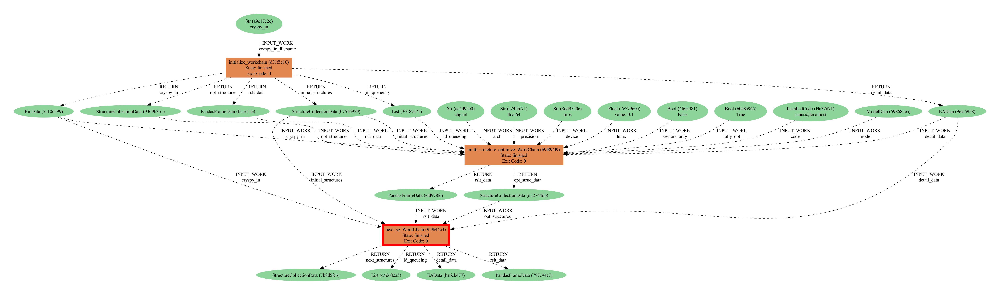

In [21]:
import subprocess
import fitz  # PyMuPDF
from PIL import Image
import io
from IPython.display import display

pk = node.pk

# Step 1: verdi コマンドで .dot.pdf を生成
subprocess.call(f"verdi node graph generate {pk}", shell=True)

# Step 2: PyMuPDF で PDF を開いて画像化
pdf_path = f"{pk}.dot.pdf"
doc = fitz.open(pdf_path)
page = doc[0]
pix = page.get_pixmap(dpi=150)

# Step 3: PIL で画像として表示
image = Image.open(io.BytesIO(pix.tobytes()))
display(image)

In [22]:
initial_structures_node_2 = result['next_structures']
id_queueing_node_2 = result['id_queueing']
rslt_data_node_2 = result['rslt_data']
detail_data_node_2 = result['detail_data']

In [23]:
input = {
    'initial_structures': initial_structures_node_2,
    'opt_structures': opt_structure_node_1,
    'id_queueing': id_queueing_node_2,
    'rslt_data': rslt_data_node_2,
    'cryspy_in': cryspy_in_node,
    'detail_data': detail_data_node_2,
    'code': code,
    "model": model,
    "arch": Str(model.architecture),
    "precision": Str("float64"),
    "device": Str("mps"),
    "fmax": Float(0.1), 
    "vectors_only": Bool(False), 
    "fully_opt": Bool(True), 
}

In [24]:
result,node = run.get_node(multi_structure_optimize_WorkChain, **input)

energy: -50.263916015625
energy: -48.18518447876
energy: -45.679058074951
energy: -44.319538116455
energy: -45.030994415283
energy: -45.581825256348
energy: -45.26195526123
energy: 48.171375274658
energy: -50.262969970703
energy: -45.095897674561


/Users/moriireo/workspace/aiida_CrySPY_nim/lib/python3.12/site-packages/aiida_dataframe/data/dataframe.py:63: FutureWarning: Starting with pandas version 3.0 all arguments of to_hdf except for the argument 'path_or_buf' will be keyword-only.
  df.to_hdf(Path(td) / self.DEFAULT_FILENAME, "w", format="table")
/Users/moriireo/workspace/aiida_CrySPY_nim/lib/python3.12/site-packages/aiida_dataframe/data/dataframe.py:68: AiidaDeprecationWarning: `PandasFrameData.set_attribute` is deprecated, use `PandasFrameData.base.attributes.set` instead. (this will be removed in v3)
  self.set_attribute("_pandas_data_hash", self._hash_dataframe(df))
/Users/moriireo/workspace/aiida_CrySPY_nim/lib/python3.12/site-packages/aiida_dataframe/data/dataframe.py:69: AiidaDeprecationWarning: `PandasFrameData.set_attribute` is deprecated, use `PandasFrameData.base.attributes.set` instead. (this will be removed in v3)
  self.set_attribute("index", list(df.index))
/Users/moriireo/workspace/aiida_CrySPY_nim/lib/python

In [25]:
result

{'structure': {'10': <StructureData: uuid: 7314d63b-4de9-4bf6-b47a-136d8a22a794 (pk: 12940)>,
  '11': <StructureData: uuid: be14c1fb-8744-443a-8019-780c9b6a6a01 (pk: 12945)>,
  '12': <StructureData: uuid: 8fcf749a-78f8-4075-bfa9-d5af16aea120 (pk: 12950)>,
  '13': <StructureData: uuid: 191e891b-4599-4411-b18e-793f37d3ed75 (pk: 12955)>,
  '14': <StructureData: uuid: 4d4ab950-56a5-4991-bffb-d56a1002af88 (pk: 12960)>,
  '15': <StructureData: uuid: 8c9143f1-2888-4122-8959-0f7d804f30d2 (pk: 12965)>,
  '16': <StructureData: uuid: 4cee07f9-0138-4646-9964-e45d4a427d72 (pk: 12970)>,
  '17': <StructureData: uuid: e8dc106a-b960-4766-be07-e62c51aa5ff2 (pk: 12975)>,
  '18': <StructureData: uuid: b08aa87e-acdc-4f00-a258-bb48ad8ce83e (pk: 12980)>,
  '19': <StructureData: uuid: 83defd8f-c6ac-4128-8b3b-55fddbb1fa42 (pk: 12985)>},
 'structure_energy_data': <Dict: uuid: 0aea8b6c-2641-4c13-b9f7-59886d45b2c6 (pk: 13081)>,
 'opt_struc_data': <StructureCollectionData: uuid: ef691d8c-4e9b-4012-b5d8-93672c71f66

In [26]:
result['opt_struc_data'].structurecollection

{0: Structure Summary
 Lattice
     abc : 3.149524404092021 3.1495229239151823 10.87381470664146
  angles : 89.99998812991933 90.00007830772242 120.00002780238101
  volume : 93.41189657174934
       A : 2.7275679753586 -1.5747624937612 -3.5205814979206e-06
       B : -1.1914389632463e-06 3.1495229239146 1.4998018291282e-06
       C : -4.8143202907099e-06 -2.9253591420856e-06 10.87381470664
     pbc : True True True
 PeriodicSite: Ga (-1.58e-06, -1.617e-05, 9.852) [1.02e-06, -3.783e-06, 0.906]
 PeriodicSite: Ga (-1.559e-05, 3.44e-06, 15.29) [-3.234e-06, 7.812e-07, 1.406]
 PeriodicSite: Ga (0.9092, 1.575, 7.124) [0.3333, 0.6667, 0.6552]
 PeriodicSite: Ga (1.818, -4.075e-05, 1.688) [0.6667, 0.3333, 0.1552]
 PeriodicSite: N (0.9092, 1.575, 5.12) [0.3333, 0.6667, 0.4708]
 PeriodicSite: N (1.818, 1.33e-05, -0.3174) [0.6667, 0.3333, -0.02919]
 PeriodicSite: N (0.9092, 1.575, 13.23) [0.3333, 0.6667, 1.217]
 PeriodicSite: N (1.818, 2.139e-05, 7.791) [0.6667, 0.3333, 0.7165],
 1: Structure Summa

In [27]:
import subprocess
import fitz  # PyMuPDF
from PIL import Image
import io
from IPython.display import display

# ノードの pk を取得
pk = node.pk

# Step 1: verdi コマンドで .dot.pdf を生成
subprocess.call(f"verdi node graph generate {pk}", shell=True)

# Step 2: PyMuPDF で PDF を開いて画像化
pdf_path = f"{pk}.dot.pdf"
doc = fitz.open(pdf_path)
page = doc[0]
pix = page.get_pixmap(dpi=150)

# Step 3: PIL で画像として表示
image = Image.open(io.BytesIO(pix.tobytes()))
display(image)

Success: Output written to `12939.dot.pdf`


/Users/moriireo/workspace/aiida_CrySPY_nim/lib/python3.12/site-packages/PIL/Image.py:3368: DecompressionBombWarning: Image size (148228250 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(


第３世代の計算

In [28]:
initial_structures_node_2
opt_structure_node_2 = result['opt_struc_data']
rslt_data_node_2 = result['rslt_data']
detail_data_node_2

<EAData: uuid: ba6cb477-cb89-4925-bc19-8a3d395a7882 (pk: 12931)>

In [29]:
input = {
    'initial_structures': initial_structures_node_2,
    'opt_structures': opt_structure_node_2,
    'rslt_data': rslt_data_node_2,
    'detail_data': detail_data_node_2,
    'cryspy_in': cryspy_in_node,
}

In [30]:
result, node = run.get_node(next_sg_WorkChain, **input)

[2025-08-04 03:51:23,250][ctrl_job][INFO] Done generation 2
[2025-08-04 03:51:23,251][utility][INFO] Backup data
[2025-08-04 03:51:23,267][ea_next_gen][INFO] # ---------- Evolutionary algorithm
[2025-08-04 03:51:23,267][ea_next_gen][INFO] Generation 3
[2025-08-04 03:51:23,270][ea_next_gen][INFO] # ------ survival of the fittest
[2025-08-04 03:51:23,330][ea_next_gen][INFO] ranking without duplication (including elite):
[2025-08-04 03:51:23,331][ea_next_gen][INFO] Structure ID     10, fitness:  -50.26392
[2025-08-04 03:51:23,332][ea_next_gen][INFO] Structure ID     11, fitness:  -48.18518
[2025-08-04 03:51:23,332][ea_next_gen][INFO] Structure ID     12, fitness:  -45.67906
[2025-08-04 03:51:23,333][ea_next_gen][INFO] Structure ID     15, fitness:  -45.58183
[2025-08-04 03:51:23,334][ea_next_gen][INFO] Structure ID     16, fitness:  -45.26196
[2025-08-04 03:51:23,334][ea_next_gen][INFO] # ------ Generate children
[2025-08-04 03:51:23,335][ea_child][INFO] # -- mindist
[2025-08-04 03:51:23,

/Users/moriireo/workspace/aiida_CrySPY_nim/lib/python3.12/site-packages/aiida_dataframe/data/dataframe.py:63: FutureWarning: Starting with pandas version 3.0 all arguments of to_hdf except for the argument 'path_or_buf' will be keyword-only.
  df.to_hdf(Path(td) / self.DEFAULT_FILENAME, "w", format="table")
/Users/moriireo/workspace/aiida_CrySPY_nim/lib/python3.12/site-packages/aiida_dataframe/data/dataframe.py:68: AiidaDeprecationWarning: `PandasFrameData.set_attribute` is deprecated, use `PandasFrameData.base.attributes.set` instead. (this will be removed in v3)
  self.set_attribute("_pandas_data_hash", self._hash_dataframe(df))
/Users/moriireo/workspace/aiida_CrySPY_nim/lib/python3.12/site-packages/aiida_dataframe/data/dataframe.py:69: AiidaDeprecationWarning: `PandasFrameData.set_attribute` is deprecated, use `PandasFrameData.base.attributes.set` instead. (this will be removed in v3)
  self.set_attribute("index", list(df.index))
/Users/moriireo/workspace/aiida_CrySPY_nim/lib/python

In [31]:
result

{'next_structures': <StructureCollectionData: uuid: 5518706e-9448-456c-a98a-ab6290546130 (pk: 13085)>,
 'id_queueing': <List: uuid: 1bb3699a-c77f-4ee9-ac02-c0516ea57e38 (pk: 13086) value: [20, 21, 22, 23, 24, 25, 26, 27, 28, 29]>,
 'detail_data': <EAData: uuid: 9b4101e3-237d-4967-aad2-006274eccc2a (pk: 13087)>,
 'rslt_data': <PandasFrameData: uuid: 69338023-9cd6-4061-a48a-9798c4a4b8c7 (pk: 13088)>}

In [32]:
from IPython.display import display

# タプルの各要素を分かりやすい変数に展開
gen, elite_struc, elite_fitness, ea_info, ea_origin = result["detail_data"].ea_data

# 1. 世代（gen）を表示
print(f"Generation: {gen}\n")

# 2. elite_struc を表示
print("--- Elite Structures ---")
print(elite_struc)
print("\n")

# 3. elite_fitness を表示
print("--- Elite Fitness ---")
print(elite_fitness)
print("\n")

# 4. ea_info (DataFrame) を綺麗に表示
print("--- EA Info (DataFrame) ---")
display(ea_info)

# 5. ea_origin (DataFrame) を綺麗に表示
print("--- EA Origin (DataFrame) ---")
display(ea_origin)

Generation: 3

--- Elite Structures ---
{10: Structure Summary
Lattice
    abc : 3.2153148107795158 5.573282869911571 6.129412860877704
 angles : 117.08385432691718 74.60094871494196 90.15009654085657
 volume : 93.383306186443
      A : 3.1683344014729 0.10816584803411 0.53684877030737
      B : 0.060880323514208 5.3597696474955 -1.5266449685649
      C : 0.68141123589242 -1.2090736588258 5.9702195633181
    pbc : True True True
PeriodicSite: Ga (3.286, 3.104, 4.527) [0.8337, 0.7602, 0.8776]
PeriodicSite: Ga (2.112, 1.438, 2.039) [0.579, 0.3417, 0.3769]
PeriodicSite: Ga (1.659, 0.3738, 5.02) [0.3299, 0.2611, 0.8779]
PeriodicSite: Ga (0.5637, 4.07, 1.018) [0.08022, 0.8433, 0.3789]
PeriodicSite: N (1.794, 1.982, 3.899) [0.3938, 0.5319, 0.7537]
PeriodicSite: N (2.207, -0.5211, 1.947) [0.6427, -0.05271, 0.2548]
PeriodicSite: N (0.6491, 2.106, 0.9089) [0.1417, 0.4474, 0.2539]
PeriodicSite: N (0.2366, 4.61, 2.878) [-0.1077, 1.033, 0.7559]}


--- Elite Fitness ---
{10: -50.263916015625}


---

,Gen,Population,Crossover,Permutation,Strain,Random,Elite,crs_lat,slct_func
0,1,10,0,0,0,10,0,random,TNM
1,2,10,5,2,2,1,1,random,TNM
2,3,10,5,2,2,1,1,random,TNM


--- EA Origin (DataFrame) ---


,Gen,Struc_ID,Operation,Parent
0,1,0,random,None
1,1,1,random,None
2,1,2,random,None
3,1,3,random,None
4,1,4,random,None
5,1,5,random,None
6,1,6,random,None
7,1,7,random,None
8,1,8,random,None
9,1,9,random,None


In [33]:
initial_structures_node_3 = result['next_structures']
id_queueing_node_3 = result['id_queueing']
rslt_data_node_3 = result['rslt_data']
detail_data_node_3 = result['detail_data']

In [34]:
input = {
    'initial_structures': initial_structures_node_3,
    'opt_structures': opt_structure_node_2,
    'id_queueing': id_queueing_node_3,
    'rslt_data': rslt_data_node_3,
    'cryspy_in': cryspy_in_node,
    'detail_data': detail_data_node_3,
    'code': code,
    "model": model,
    "arch": Str(model.architecture),
    "precision": Str("float64"),
    "device": Str("mps"),
    "fmax": Float(0.1), 
    "vectors_only": Bool(False), 
    "fully_opt": Bool(True), 
}

In [35]:
result,node = run.get_node(multi_structure_optimize_WorkChain, **input)

energy: -46.270210266113
energy: -45.549446105957
energy: -50.263946533203
energy: -45.450168609619
energy: -44.968902587891
energy: -44.528930664062
energy: -45.476039886475
energy: -45.641620635986
energy: -48.195171356201
energy: -43.682434082031


/Users/moriireo/workspace/aiida_CrySPY_nim/lib/python3.12/site-packages/aiida_dataframe/data/dataframe.py:63: FutureWarning: Starting with pandas version 3.0 all arguments of to_hdf except for the argument 'path_or_buf' will be keyword-only.
  df.to_hdf(Path(td) / self.DEFAULT_FILENAME, "w", format="table")
/Users/moriireo/workspace/aiida_CrySPY_nim/lib/python3.12/site-packages/aiida_dataframe/data/dataframe.py:68: AiidaDeprecationWarning: `PandasFrameData.set_attribute` is deprecated, use `PandasFrameData.base.attributes.set` instead. (this will be removed in v3)
  self.set_attribute("_pandas_data_hash", self._hash_dataframe(df))
/Users/moriireo/workspace/aiida_CrySPY_nim/lib/python3.12/site-packages/aiida_dataframe/data/dataframe.py:69: AiidaDeprecationWarning: `PandasFrameData.set_attribute` is deprecated, use `PandasFrameData.base.attributes.set` instead. (this will be removed in v3)
  self.set_attribute("index", list(df.index))
/Users/moriireo/workspace/aiida_CrySPY_nim/lib/python

第四世代の計算

In [36]:
initial_structures_node_3
opt_structure_node_3 = result['opt_struc_data']
rslt_data_node_3 = result['rslt_data']
detail_data_node_3

<EAData: uuid: 9b4101e3-237d-4967-aad2-006274eccc2a (pk: 13087)>

In [37]:
input = {
    'initial_structures': initial_structures_node_3,
    'opt_structures': opt_structure_node_3,
    'rslt_data': rslt_data_node_3,
    'detail_data': detail_data_node_3,
    'cryspy_in': cryspy_in_node,
}

In [38]:
result, node = run.get_node(next_sg_WorkChain, **input)

[2025-08-04 03:59:55,897][ctrl_job][INFO] Done generation 3
[2025-08-04 03:59:55,897][utility][INFO] Backup data
[2025-08-04 03:59:55,914][ea_next_gen][INFO] # ---------- Evolutionary algorithm
[2025-08-04 03:59:55,914][ea_next_gen][INFO] Generation 4
[2025-08-04 03:59:55,917][ea_next_gen][INFO] # ------ survival of the fittest
[2025-08-04 03:59:55,943][ea_next_gen][INFO] ranking without duplication (including elite):
[2025-08-04 03:59:55,944][ea_next_gen][INFO] Structure ID     22, fitness:  -50.26395
[2025-08-04 03:59:55,944][ea_next_gen][INFO] Structure ID     28, fitness:  -48.19517
[2025-08-04 03:59:55,945][ea_next_gen][INFO] Structure ID     20, fitness:  -46.27021
[2025-08-04 03:59:55,946][ea_next_gen][INFO] Structure ID     27, fitness:  -45.64162
[2025-08-04 03:59:55,947][ea_next_gen][INFO] Structure ID     21, fitness:  -45.54945
[2025-08-04 03:59:55,947][ea_next_gen][INFO] # ------ Generate children
[2025-08-04 03:59:55,948][ea_child][INFO] # -- mindist
[2025-08-04 03:59:55,

/Users/moriireo/workspace/aiida_CrySPY_nim/lib/python3.12/site-packages/aiida_dataframe/data/dataframe.py:63: FutureWarning: Starting with pandas version 3.0 all arguments of to_hdf except for the argument 'path_or_buf' will be keyword-only.
  df.to_hdf(Path(td) / self.DEFAULT_FILENAME, "w", format="table")
/Users/moriireo/workspace/aiida_CrySPY_nim/lib/python3.12/site-packages/aiida_dataframe/data/dataframe.py:68: AiidaDeprecationWarning: `PandasFrameData.set_attribute` is deprecated, use `PandasFrameData.base.attributes.set` instead. (this will be removed in v3)
  self.set_attribute("_pandas_data_hash", self._hash_dataframe(df))
/Users/moriireo/workspace/aiida_CrySPY_nim/lib/python3.12/site-packages/aiida_dataframe/data/dataframe.py:69: AiidaDeprecationWarning: `PandasFrameData.set_attribute` is deprecated, use `PandasFrameData.base.attributes.set` instead. (this will be removed in v3)
  self.set_attribute("index", list(df.index))
/Users/moriireo/workspace/aiida_CrySPY_nim/lib/python

In [39]:
from IPython.display import display

# タプルの各要素を分かりやすい変数に展開
gen, elite_struc, elite_fitness, ea_info, ea_origin = result["detail_data"].ea_data

# 1. 世代（gen）を表示
print(f"Generation: {gen}\n")

# 2. elite_struc を表示
print("--- Elite Structures ---")
print(elite_struc)
print("\n")

# 3. elite_fitness を表示
print("--- Elite Fitness ---")
print(elite_fitness)
print("\n")

# 4. ea_info (DataFrame) を綺麗に表示
print("--- EA Info (DataFrame) ---")
display(ea_info)

# 5. ea_origin (DataFrame) を綺麗に表示
print("--- EA Origin (DataFrame) ---")
display(ea_origin)

Generation: 4

--- Elite Structures ---
{22: Structure Summary
Lattice
    abc : 3.222106011326019 5.571241027971802 6.108988280427808
 angles : 116.9916601982445 74.70704062453237 89.9569262033039
 volume : 93.32743411603396
      A : 3.1756823793945 0.1116933053067 0.53341651547006
      B : 0.070910703772356 5.3596570030014 -1.5191362921163
      C : 0.67766807391748 -1.2044130963422 5.9506212184407
    pbc : True True True
PeriodicSite: Ga (3.466, 1.274, 1.247) [1.047, 0.2567, 0.1812]
PeriodicSite: Ga (3.051, 3.77, 3.208) [0.7966, 0.84, 0.6821]
PeriodicSite: Ga (1.926, 3.899, 0.2286) [0.5506, 0.757, 0.1823]
PeriodicSite: Ga (1.432, 1.032, 3.698) [0.298, 0.3395, 0.6815]
PeriodicSite: N (1.976, 0.1536, 0.6403) [0.6085, 0.0296, 0.06061]
PeriodicSite: N (3.137, 1.808, 3.115) [0.8584, 0.4454, 0.5603]
PeriodicSite: N (1.585, 4.433, 2.089) [0.3586, 0.9455, 0.5602]
PeriodicSite: N (0.4344, 2.782, -0.3868) [0.1121, 0.5303, 0.06033]}


--- Elite Fitness ---
{22: -50.263946533203}


--- EA In

,Gen,Population,Crossover,Permutation,Strain,Random,Elite,crs_lat,slct_func
0,1,10,0,0,0,10,0,random,TNM
1,2,10,5,2,2,1,1,random,TNM
2,3,10,5,2,2,1,1,random,TNM
3,4,10,5,2,2,1,1,random,TNM


--- EA Origin (DataFrame) ---


,Gen,Struc_ID,Operation,Parent
0,1,0,random,None
1,1,1,random,None
2,1,2,random,None
3,1,3,random,None
4,1,4,random,None
5,1,5,random,None
6,1,6,random,None
7,1,7,random,None
8,1,8,random,None
9,1,9,random,None


In [40]:
initial_structures_node_4 = result['next_structures']
id_queueing_node_4 = result['id_queueing']
rslt_data_node_4 = result['rslt_data']
detail_data_node_4 = result['detail_data']

In [41]:
input = {
    'initial_structures': initial_structures_node_4,
    'opt_structures': opt_structure_node_3,
    'id_queueing': id_queueing_node_4,
    'rslt_data': rslt_data_node_4,
    'cryspy_in': cryspy_in_node,
    'detail_data': detail_data_node_4,
    'code': code,
    "model": model,
    "arch": Str(model.architecture),
    "precision": Str("float64"),
    "device": Str("mps"),
    "fmax": Float(0.1), 
    "vectors_only": Bool(False), 
    "fully_opt": Bool(True), 
}

In [42]:
result,node = run.get_node(multi_structure_optimize_WorkChain, **input)

Python(14280) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
Python(14312) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
Python(14340) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
Python(14367) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
Python(14390) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
Python(14412) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
Python(14443) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
Python(14473) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
Python(14502) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
Python(14528) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
Python(14552) Malloc

energy: -45.323131561279
energy: -46.180599212646
energy: -45.031806945801
energy: -44.605140686035
energy: -48.224658966064
energy: -45.401348114014
energy: -46.093654632568
energy: -50.187145233154
energy: -50.221946716309
energy: -44.539333343506


/Users/moriireo/workspace/aiida_CrySPY_nim/lib/python3.12/site-packages/aiida_dataframe/data/dataframe.py:63: FutureWarning: Starting with pandas version 3.0 all arguments of to_hdf except for the argument 'path_or_buf' will be keyword-only.
  df.to_hdf(Path(td) / self.DEFAULT_FILENAME, "w", format="table")
/Users/moriireo/workspace/aiida_CrySPY_nim/lib/python3.12/site-packages/aiida_dataframe/data/dataframe.py:68: AiidaDeprecationWarning: `PandasFrameData.set_attribute` is deprecated, use `PandasFrameData.base.attributes.set` instead. (this will be removed in v3)
  self.set_attribute("_pandas_data_hash", self._hash_dataframe(df))
/Users/moriireo/workspace/aiida_CrySPY_nim/lib/python3.12/site-packages/aiida_dataframe/data/dataframe.py:69: AiidaDeprecationWarning: `PandasFrameData.set_attribute` is deprecated, use `PandasFrameData.base.attributes.set` instead. (this will be removed in v3)
  self.set_attribute("index", list(df.index))
/Users/moriireo/workspace/aiida_CrySPY_nim/lib/python

In [43]:
import subprocess
import fitz  # PyMuPDF
from PIL import Image
import io
from IPython.display import display

# ノードの pk を取得
pk = node.pk

# Step 1: verdi コマンドで .dot.pdf を生成
subprocess.call(f"verdi node graph generate {pk}", shell=True)

# Step 2: PyMuPDF で PDF を開いて画像化
pdf_path = f"{pk}.dot.pdf"
doc = fitz.open(pdf_path)
page = doc[0]
pix = page.get_pixmap(dpi=150)

# Step 3: PIL で画像として表示
image = Image.open(io.BytesIO(pix.tobytes()))
display(image)

Python(15776) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


Success: Output written to `13251.dot.pdf`


DecompressionBombError: Image size (237231756 pixels) exceeds limit of 178956970 pixels, could be decompression bomb DOS attack.